In [1]:
pip install mahotas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 5.7 MB 5.6 MB/s 


In [2]:
!git clone https://github.com/tensorflow/tpu/

Cloning into 'tpu'...
remote: Enumerating objects: 10938, done.
remote: Counting objects: 100% (1140/1140), done.
remote: Compressing objects: 100% (588/588), done.
remote: Total 10938 (delta 635), reused 979 (delta 527), pack-reused 9798
Receiving objects: 100% (10938/10938), 45.77 MiB | 28.30 MiB/s, done.
Resolving deltas: 100% (7673/7673), done.


In [3]:
import keras
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
import sys
sys.path.append('/content/drive/MyDrive/Colab Notebooks')
import keyframe
import segmentation
from IPython import display
seed_value= 5
import random
random.seed(seed_value)
np.random.seed(seed_value)
tf.random.set_seed(seed_value)


Instructions for updating:
This function will only be available through the v1 compatibility library as tf.compat.v1.saved_model.loader.load or tf.compat.v1.saved_model.load. There will be a new function for importing SavedModels in Tensorflow 2.0.


TPU address is grpc://10.110.169.210:8470
TPU devices:
[_DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:CPU:0, CPU, -1, 204381810795441953),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 8589934592, 2596512583140405849),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:0, TPU, 17179869184, -1191319440120491540),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:1, TPU, 17179869184, 2110601300953767930),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:2, TPU, 17179869184, 2535245711733052210),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:3, TPU, 17179869184, 8872197899184963689),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:4, TPU, 17179869184, 6590584843497016976),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:5, TPU, 17179869184, -4841765745660915645),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:6, TPU, 17179869184, 89247381

In [4]:
def load_feature_extractor(model='VGG16'):
  if model=='VGG16':
    base_model = tf.keras.applications.VGG16(
      weights="imagenet",
      input_shape=(224,224,3)
    )
  elif model=='VGG19':
    base_model = tf.keras.applications.VGG19(
      weights="imagenet",
      input_shape=(224,224,3)
    )
  x = base_model.layers[-2].output
  cnn_model = Model(inputs=base_model.input, outputs=x)
  return cnn_model

def extract_features(video):
  feature_extractor = load_feature_extractor()
  X = []
  v = []
  for img in video:
      img = cv2.resize(img,(224,224))
      img = feature_extractor.predict(img.reshape(1,224,224,3))
      v.append(img.reshape(feature_extractor.output.shape[1]))
  X.append(v)
  X = np.array(X)
  return X

def extract_keyframe(video_path,nkey, rotate = False):
  kfs,labels = keyframe.get_keyframe_list_thread(video_path,nkey)
  cap = cv2.VideoCapture(video_path)
  keyframes = []
  for i in kfs:
    cap.set(1,i)
    _, frame = cap.read()
    if rotate:
      frame = cv2.rotate(frame, cv2.ROTATE_180)
    keyframes.append(frame)
    if frame is None:
      continue
  return keyframes

def segment_frames(video):
  seg_frames = []
  for img in video:
      img = segmentation.extract_person(img,False)
      seg_frames.append(img)
  return seg_frames

In [15]:
label = {0:'Non Fall',1:'Fall'}


def plot_video_frames(video_path):
  cap = cv2.VideoCapture(video_path)
  f, ax = plt.subplots(2,8,figsize=(15,6))
  i = 0
  for ax1 in ax:
    for ax2 in ax1:
      cap.set(1,i);
      success, frame = cap.read()
      frame = cv2.resize(frame,(224,224))
      i = i+1
      ax2.imshow(cv2.cvtColor(frame,cv2.COLOR_BGR2RGB))
      ax2.axis('off')
  f.tight_layout()

def plot_frames(video,name='keyframes'):
  f, ax = plt.subplots(4,4,figsize=(15,6))
  i = 0
  for ax1 in ax:
    for ax2 in ax1:
      frame = video[i]
      frame = cv2.resize(frame,(224,224))
      i = i+1
      ax2.imshow(cv2.cvtColor(frame,cv2.COLOR_BGR2RGB))
      ax2.axis('off')
  f.tight_layout()
  plt.show()
  plt.savefig(name+'.png')
  
def plot_frames_(video,name='keyframes'):
  f, ax = plt.subplots(4,4,figsize=(15,6))
  i = 0
  for ax1 in ax:
    for ax2 in ax1:
      frame = video[i]
      frame = cv2.resize(frame,(224,224))
      i = i+1
      ax2.imshow(cv2.cvtColor(frame,cv2.COLOR_BGR2RGB))
      ax2.axis('off')
  f.tight_layout()
  plt.show()
  plt.savefig(name+'.png')

In [7]:
def process_and_predict(model,video_path,rotate = False):
  if model=='mcfd':
    model = keras.models.load_model('/content/drive/MyDrive/Final Model saved/mcfd_vgg16.h5')
  elif model=='urfd':
    model = keras.models.load_model('/content/drive/MyDrive/Final Model saved/urfd_vgg16.h5')
  else:
    raise ValueError('Invalid Model')
  keyframes = extract_keyframe(video_path,16,rotate)
  plot_frames(keyframes,'keyframes')
  display.display(display.Image("keyframes.png"))
  segmented_frames = segment_frames(keyframes)
  plot_frames(segmented_frames,'segmented_frames')
  display.display(display.Image("segmented_frames.png"))
  features = extract_features(segmented_frames)
  pred = model.predict(features)
  return pred

# MCFD

100%|██████████| 214/214 [00:07<00:00, 29.65it/s]


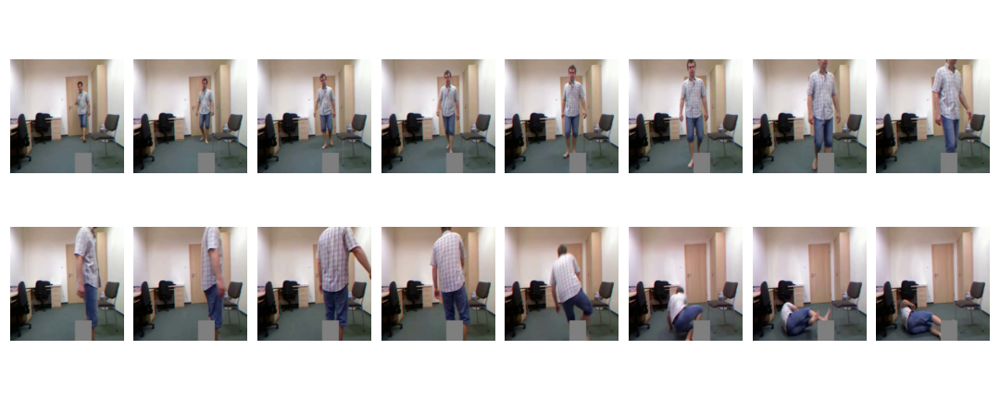

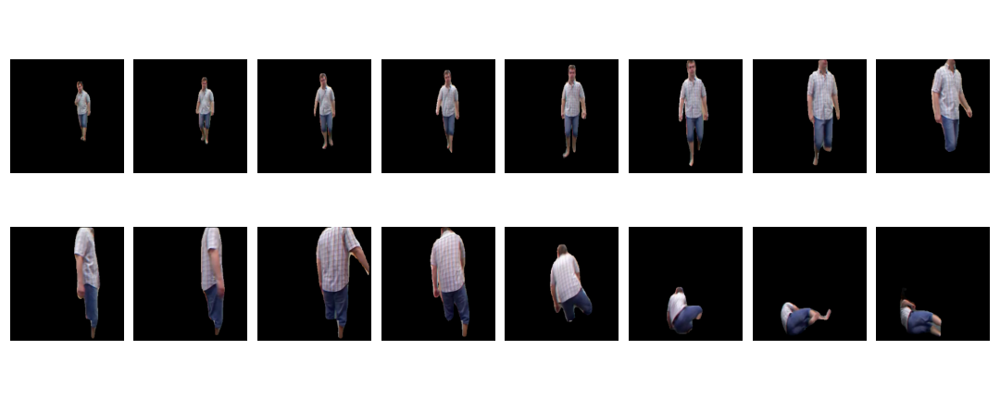

1

In [ ]:
path = 'B10.mp4'
pred = process_and_predict('mcfd',path)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

100%|██████████| 214/214 [00:06<00:00, 32.39it/s]


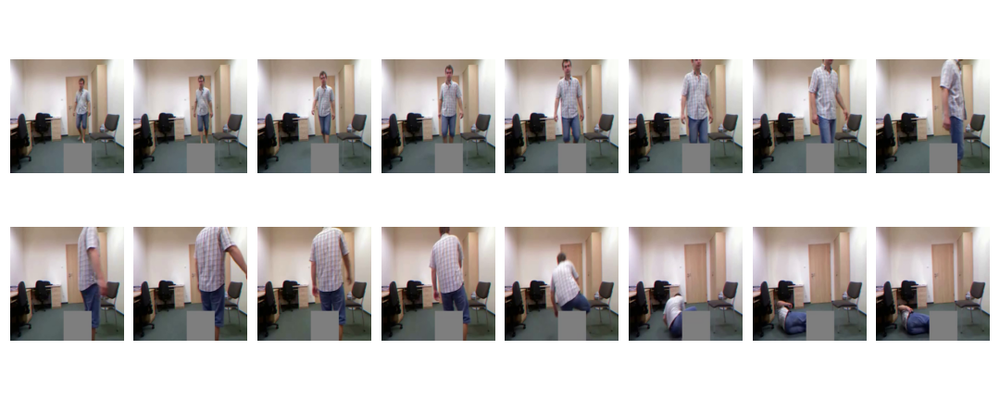

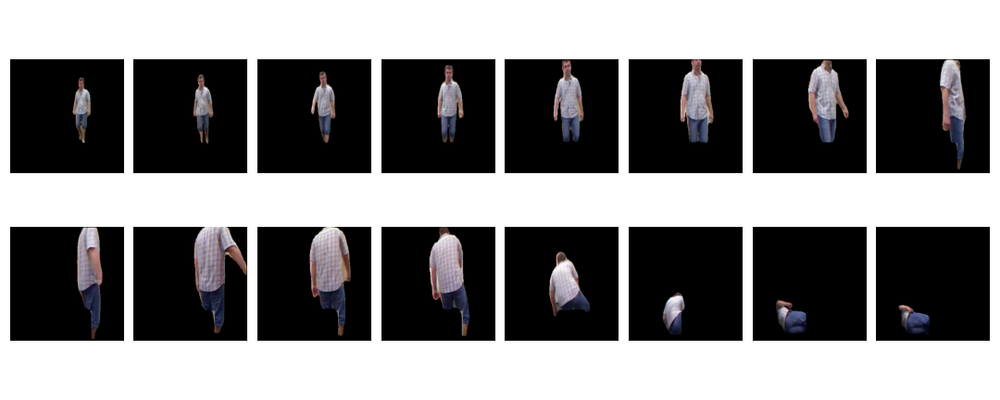

Prediction: Fall


In [ ]:
path = 'B25.mp4'
pred = process_and_predict('mcfd',path)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

100%|██████████| 149/149 [00:07<00:00, 20.45it/s]


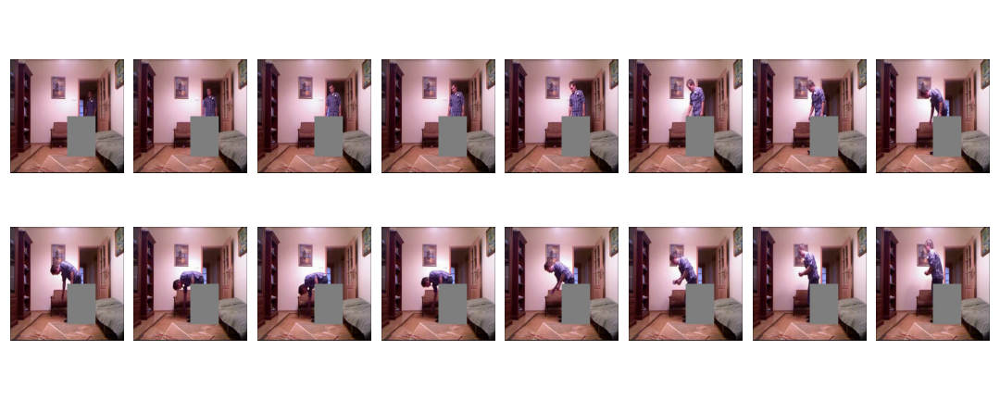

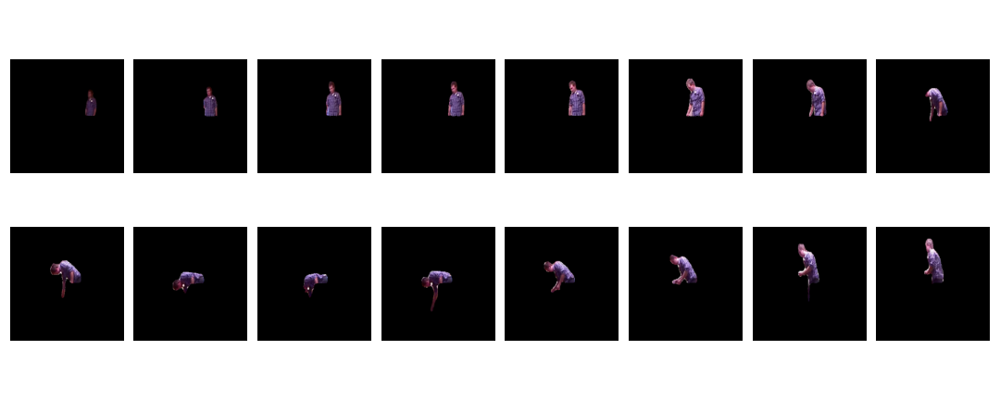

Prediction: Non Fall


In [ ]:
path = '/content/drive/MyDrive/ArtificiallyOccluded/non-fall4_video/urfd_non_fall4(80%_occ).mp4'
pred = process_and_predict('mcfd',path)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

# URFD

100%|██████████| 214/214 [00:09<00:00, 21.80it/s]


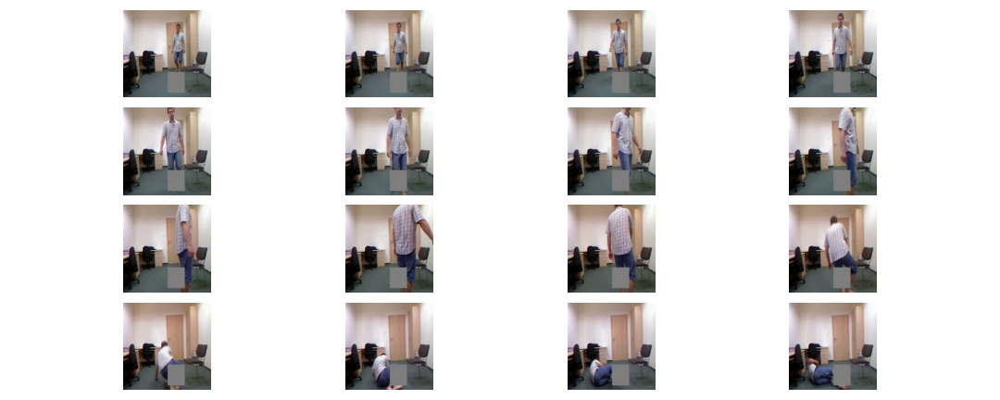

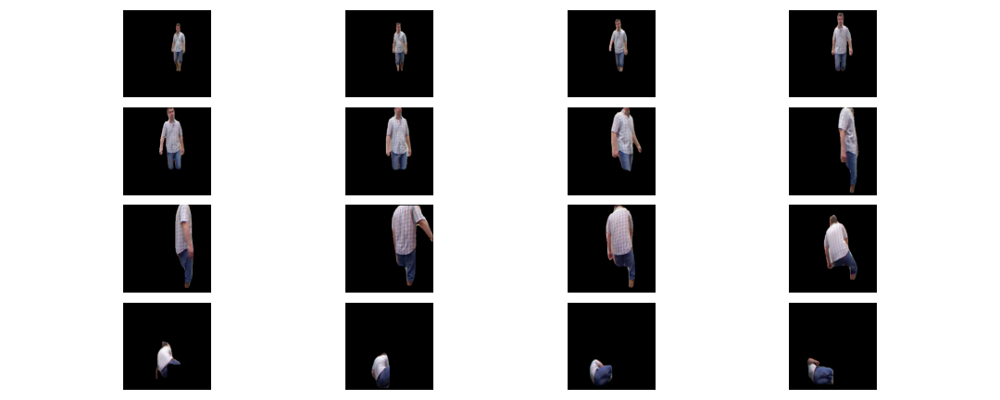

Prediction: Fall


In [ ]:
path = '/content/urfd_fall5(20%_occ).mp4'
pred = process_and_predict('urfd',path)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

100%|██████████| 214/214 [00:10<00:00, 20.67it/s]


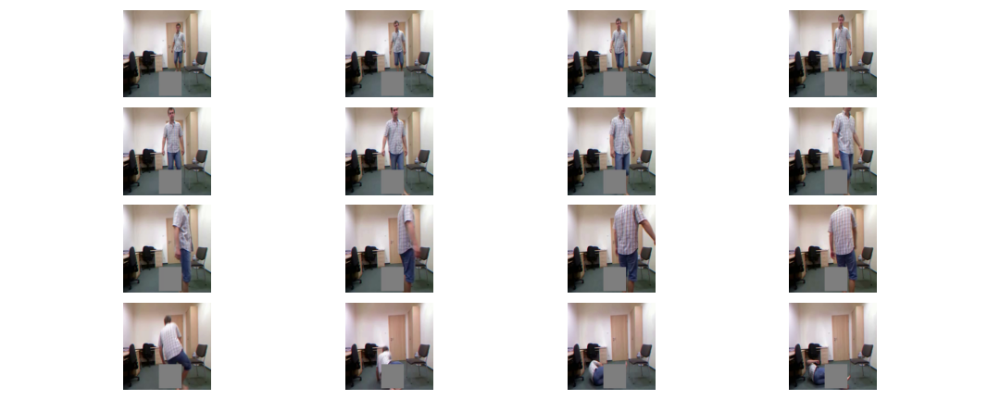

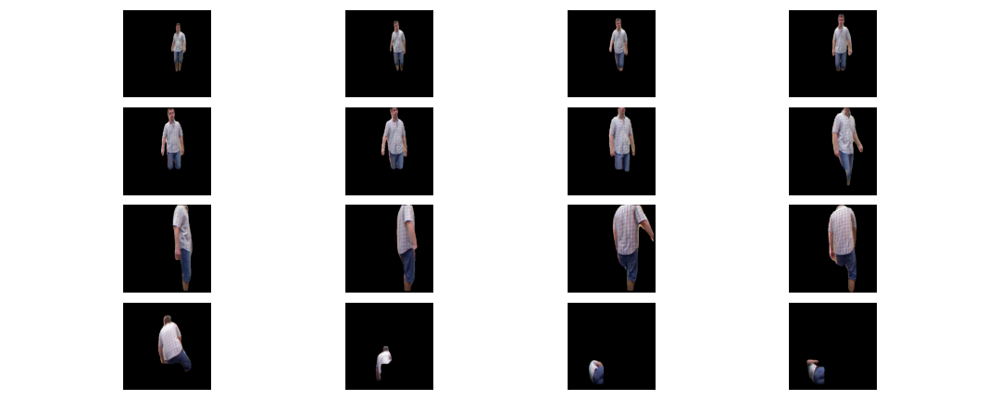

Prediction: Fall


In [ ]:
path = '/content/urfd_fall5(50%_occ).mp4'
pred = process_and_predict('urfd',path)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

100%|██████████| 214/214 [00:09<00:00, 22.75it/s]


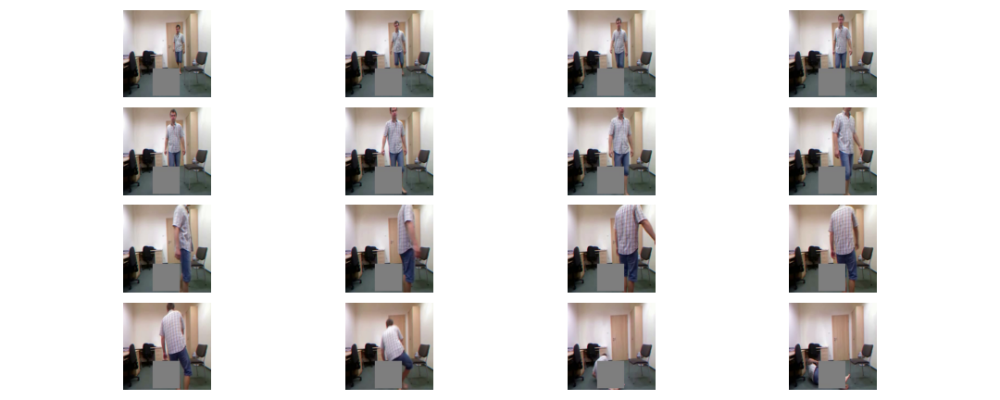

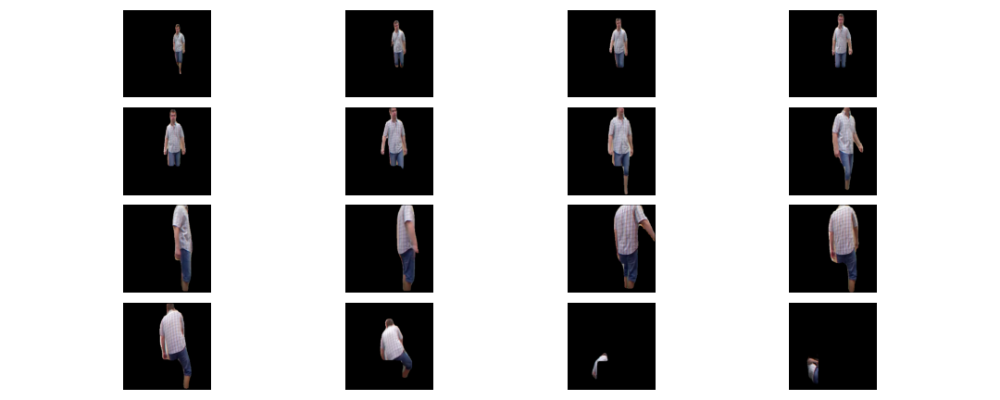

553476096/553467096 [==============================] - 3s 0us/step
Prediction: Fall


In [9]:
path = '/content/urfd_fall5(80%_occ).mp4'
pred = process_and_predict('urfd',path)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

100%|██████████| 214/214 [00:06<00:00, 32.33it/s]


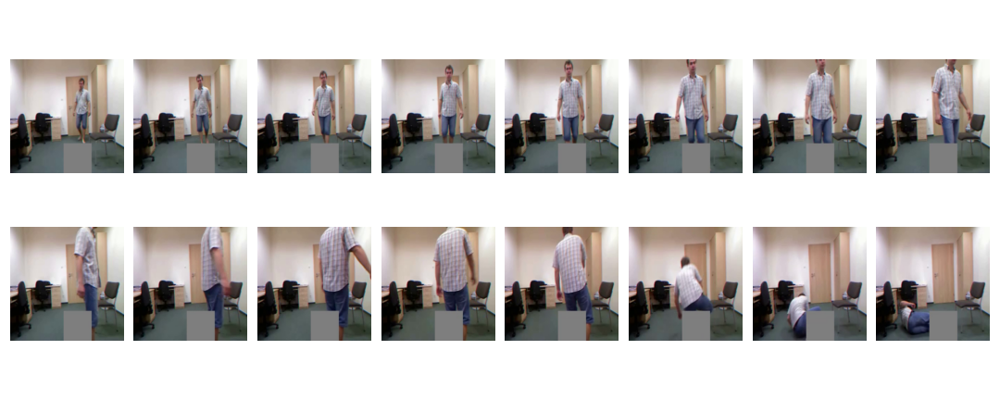

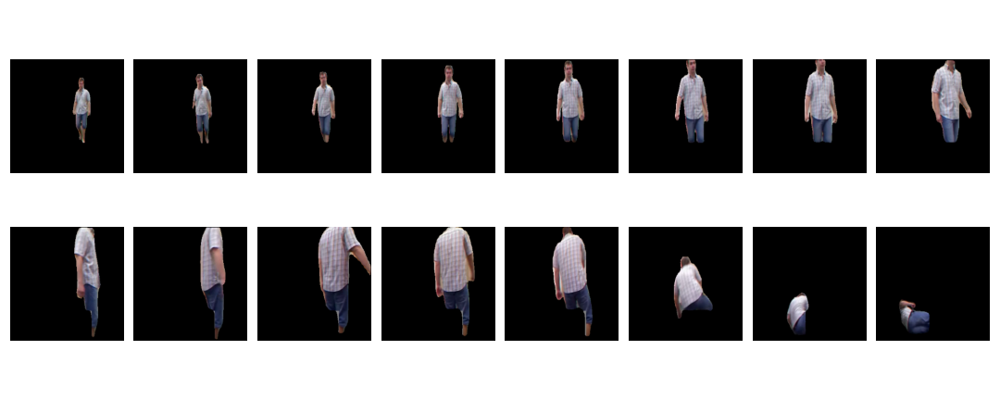

Prediction: Fall


In [ ]:
path = 'B25.mp4'
pred = process_and_predict('urfd',path)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

100%|██████████| 179/179 [00:08<00:00, 19.98it/s]


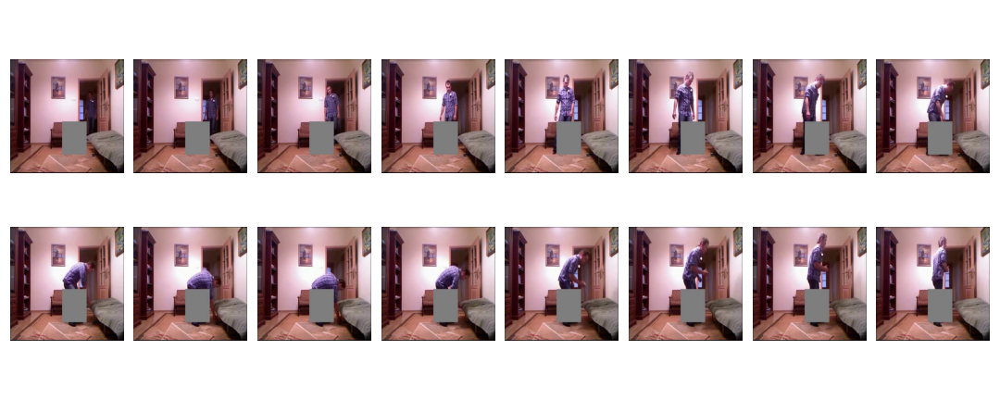

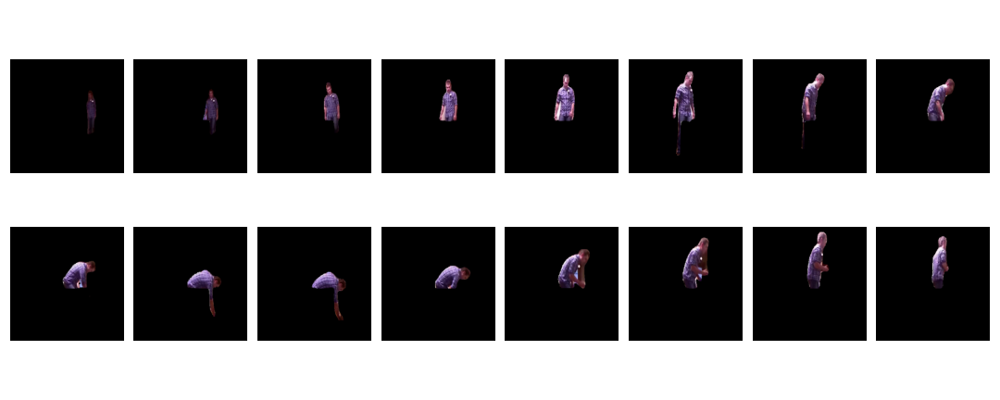

553476096/553467096 [==============================] - 4s 0us/step
Prediction: Non Fall


In [ ]:
path = '/content/drive/MyDrive/ArtificiallyOccluded/non-fall5_video/urfd_non_fall5(50%_occ).mp4'
pred = process_and_predict('urfd',path)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

100%|██████████| 299/299 [00:13<00:00, 22.05it/s]


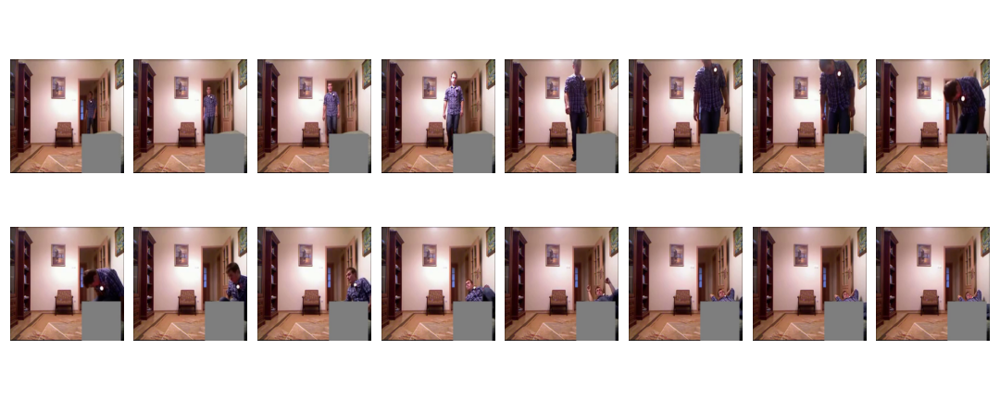

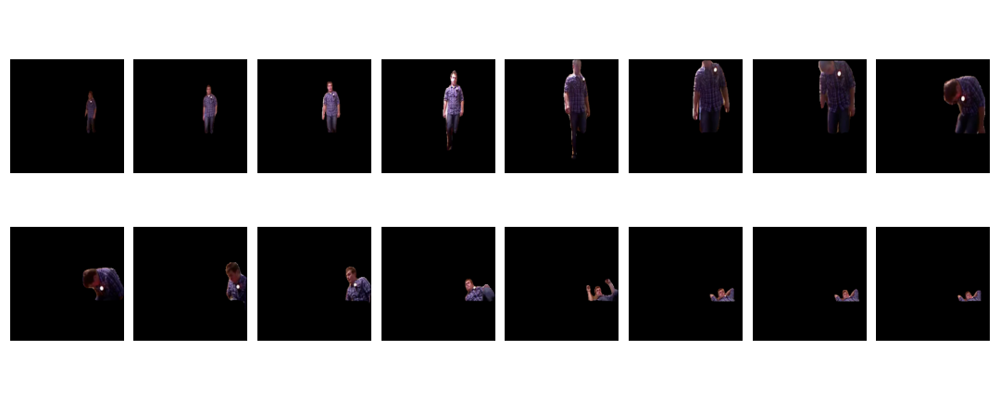

Prediction: Non Fall


In [ ]:
path = '/content/drive/MyDrive/ArtificiallyOccluded/non-fall/non-fall10_video/urfd_non_fall10(80%_occ).mp4'
pred = process_and_predict('urfd',path)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

100%|██████████| 179/179 [00:08<00:00, 21.68it/s]


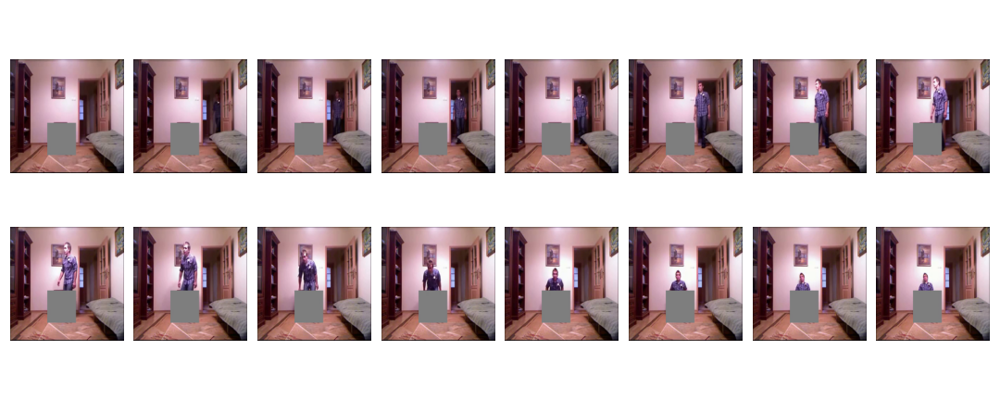

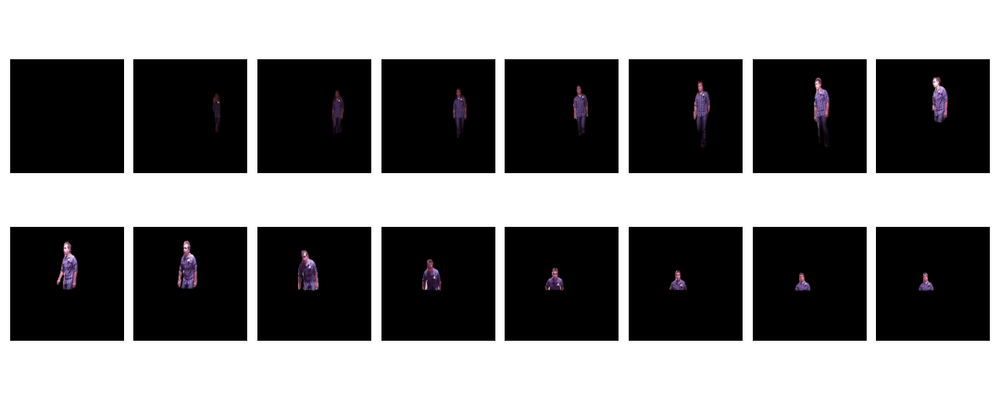

Prediction: Non Fall


In [ ]:
path = '/content/drive/MyDrive/ArtificiallyOccluded/non-fall/non-fall8_video/urfd_non_fall8(80%_occ).mp4'
pred = process_and_predict('urfd',path)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

#Self-dataset_single

100%|██████████| 158/158 [00:10<00:00, 15.22it/s]


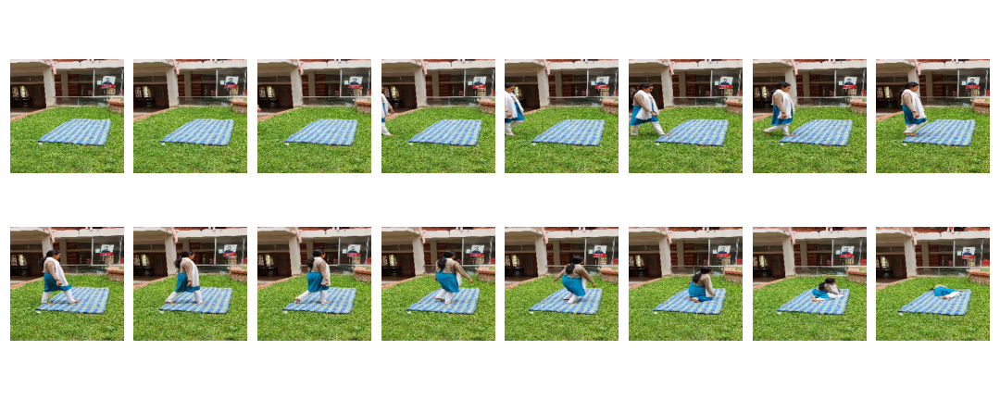

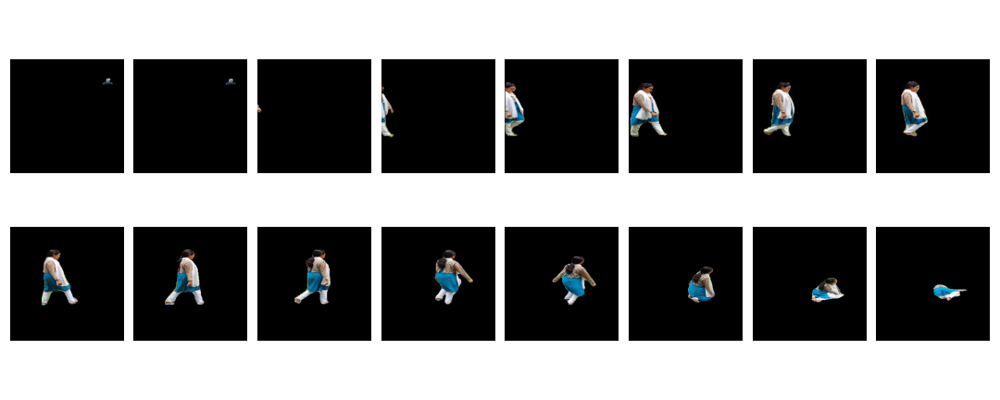

553476096/553467096 [==============================] - 9s 0us/step
(1, 16, 4096)
Prediction: Fall


In [ ]:
path = '/content/drive/MyDrive/Self_dataset/Single/fall/self_fall-03.mp4'
pred = process_and_predict('urfd',path,rotate=True)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

100%|██████████| 153/153 [00:09<00:00, 15.99it/s]


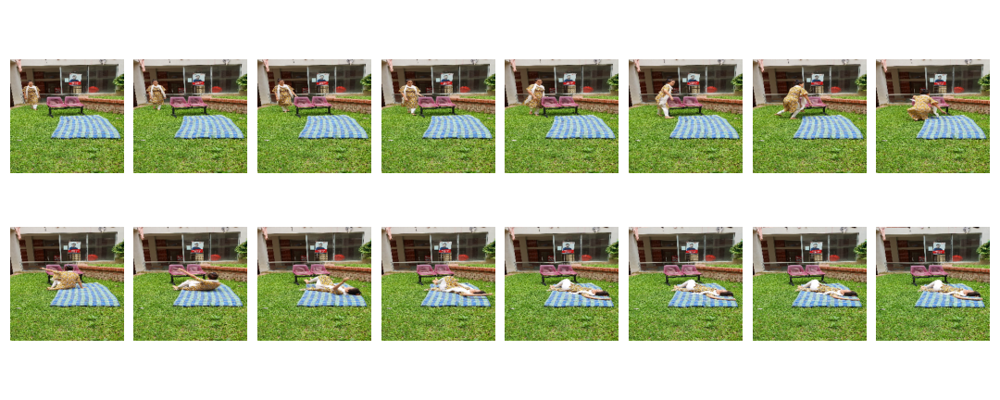

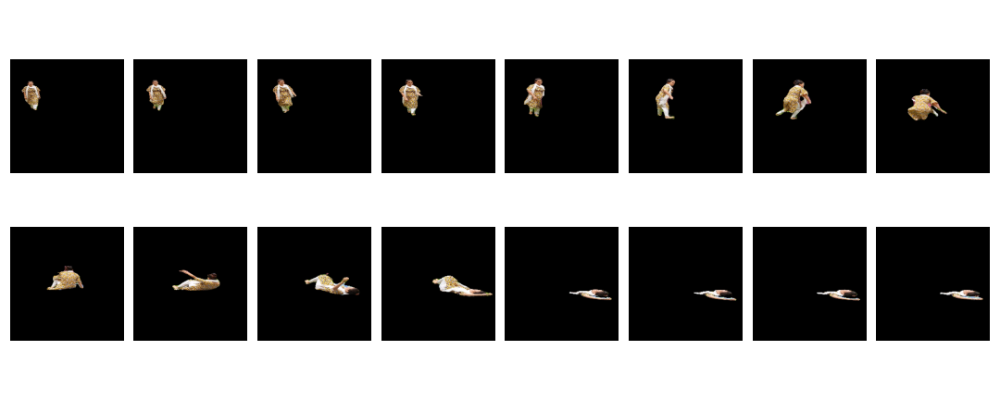

Prediction: Fall


In [ ]:
path = '/content/drive/MyDrive/Self_dataset/Single/fall/self_fall-12.mp4'
pred = process_and_predict('urfd',path,rotate=True)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

100%|██████████| 134/134 [00:08<00:00, 16.37it/s]


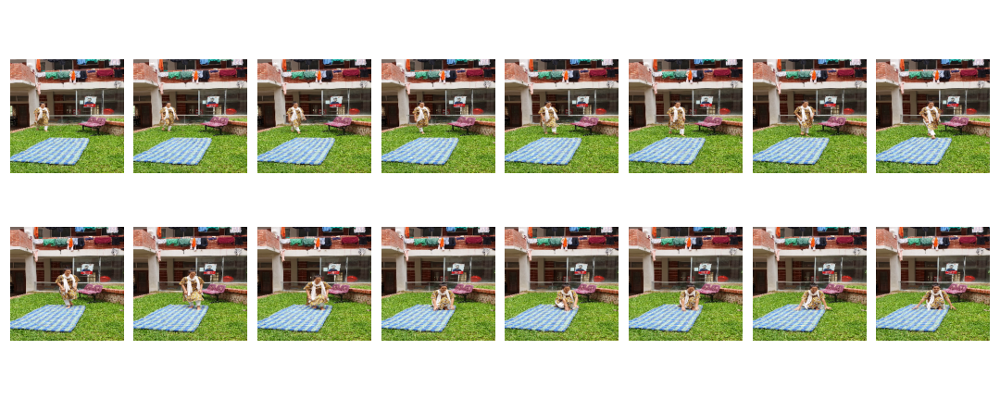

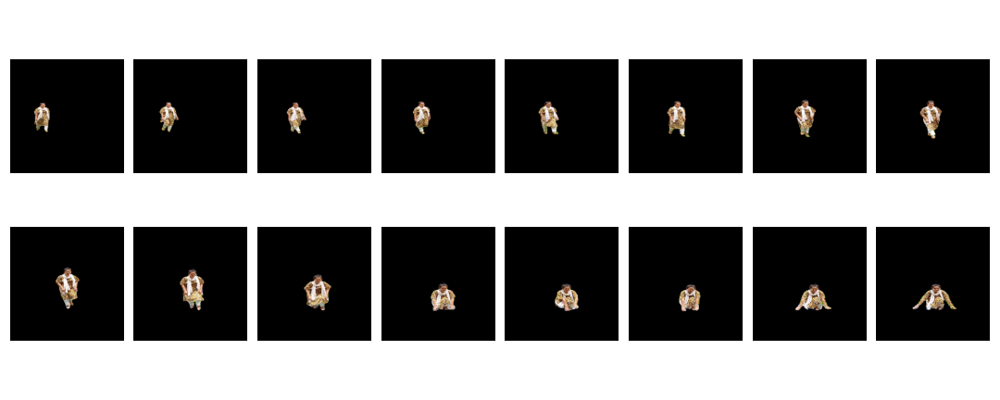

Prediction: Non Fall


In [ ]:
path = '/content/drive/MyDrive/Self_dataset/Single/non_fall/self_nonfall-11.mp4'
pred = process_and_predict('urfd',path,rotate=True)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

100%|██████████| 148/148 [00:09<00:00, 15.97it/s]


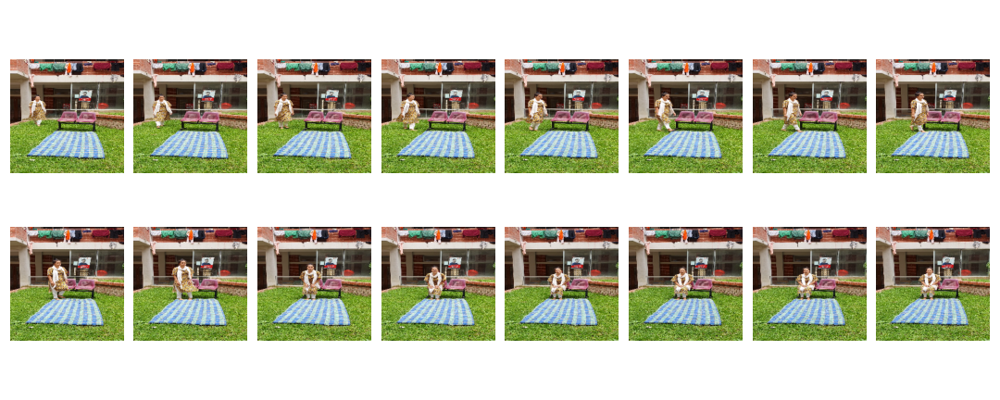

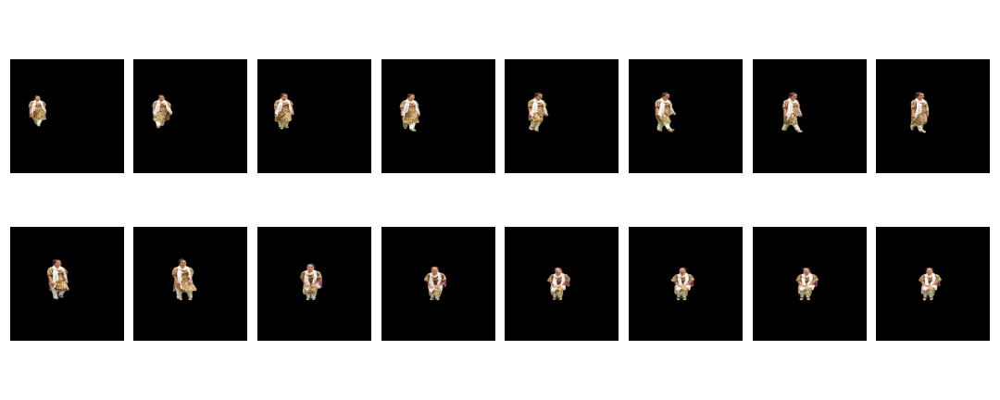

Prediction: Non Fall


In [ ]:
path = '/content/drive/MyDrive/Self_dataset/Single/non_fall/self_nonfall-08.mp4'
pred = process_and_predict('urfd',path,rotate=True)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

#Self-dataset_multiple


100%|██████████| 137/137 [00:05<00:00, 24.98it/s]


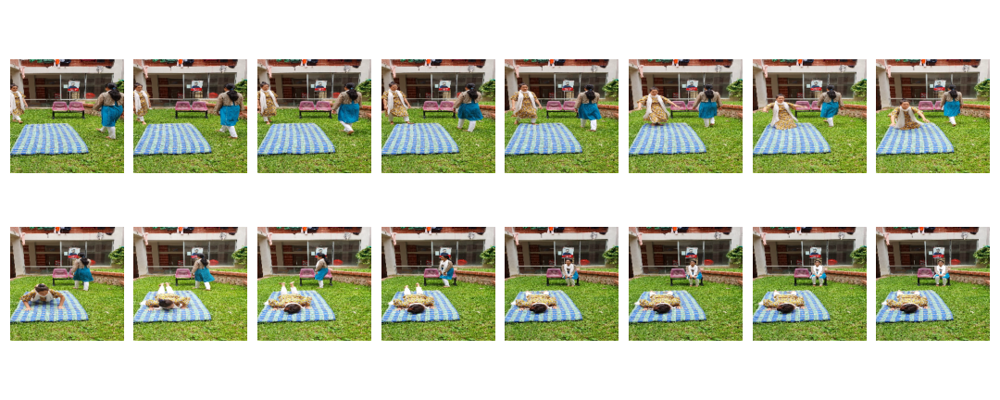

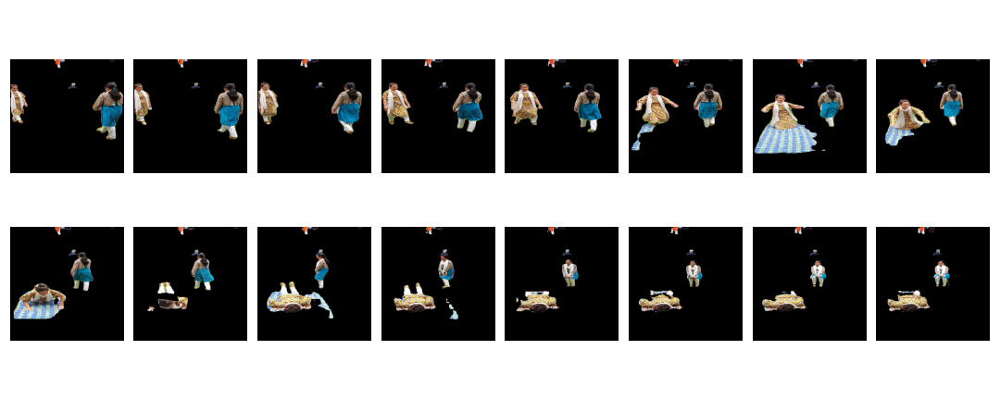

Prediction: Fall


In [ ]:
path = '/content/fall06.mp4'
pred = process_and_predict('urfd',path,rotate=True)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

100%|██████████| 122/122 [00:05<00:00, 24.39it/s]


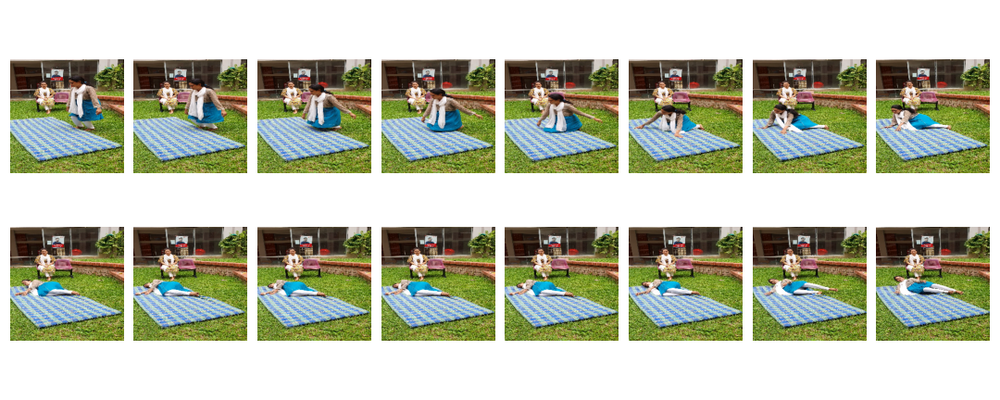

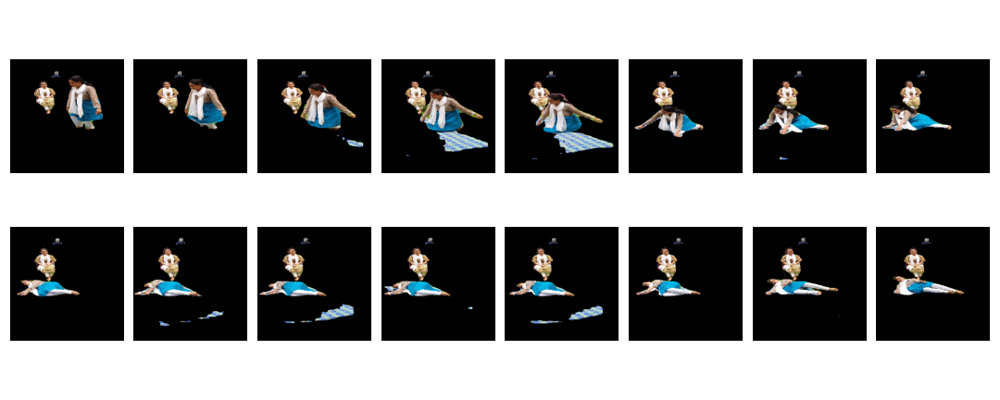

Prediction: Fall


In [ ]:
path = '/content/fall13.mp4'
pred = process_and_predict('urfd',path,rotate=True)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

100%|██████████| 145/145 [00:06<00:00, 23.20it/s]


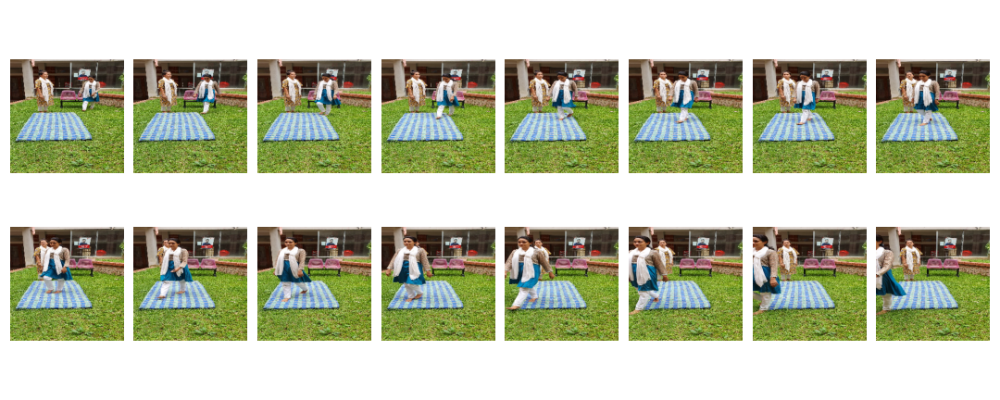

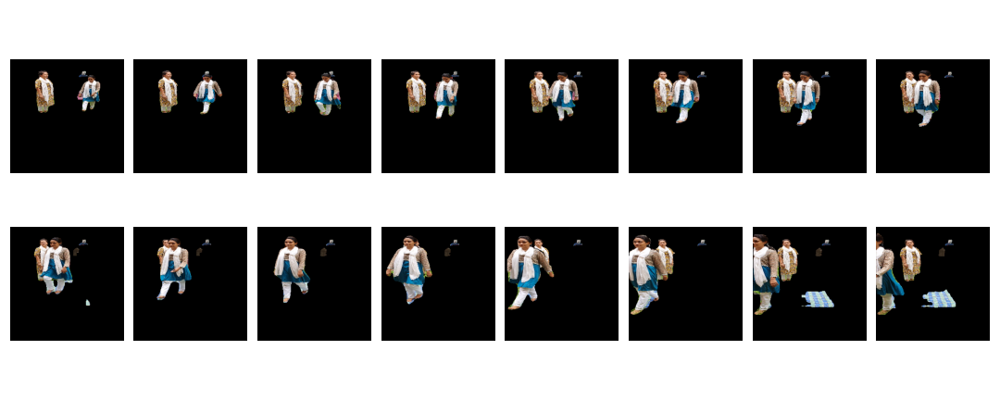

Prediction: Non Fall


In [ ]:
path = '/content/non-fall07.mp4'
pred = process_and_predict('urfd',path,rotate=True)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

100%|██████████| 138/138 [00:05<00:00, 24.77it/s]


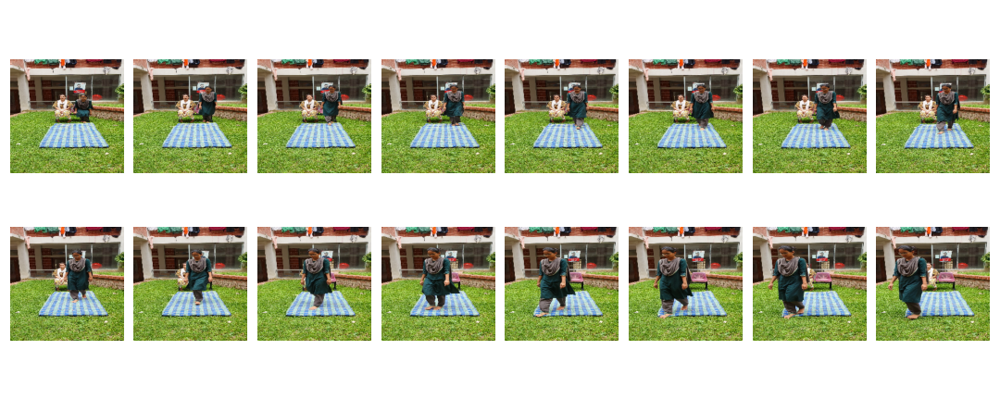

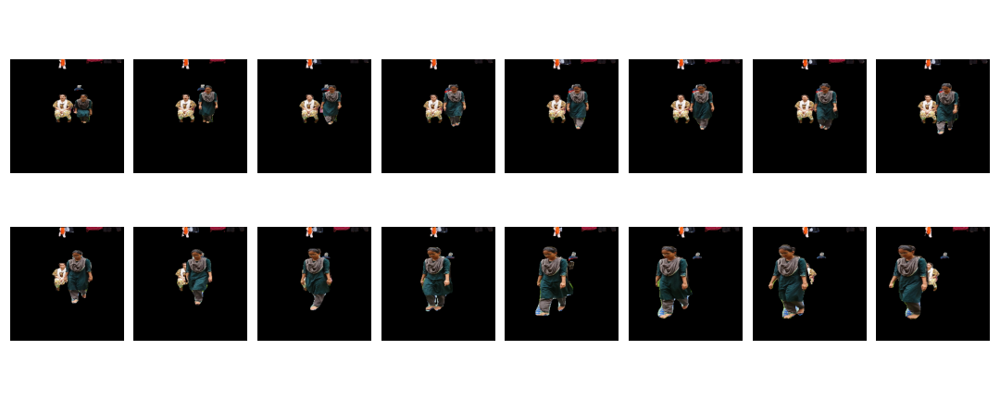

Prediction: Fall


In [ ]:
path = '/content/non-fall11.mp4'
pred = process_and_predict('urfd',path,rotate=True)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

#Youtube

100%|██████████| 300/300 [00:12<00:00, 23.26it/s]


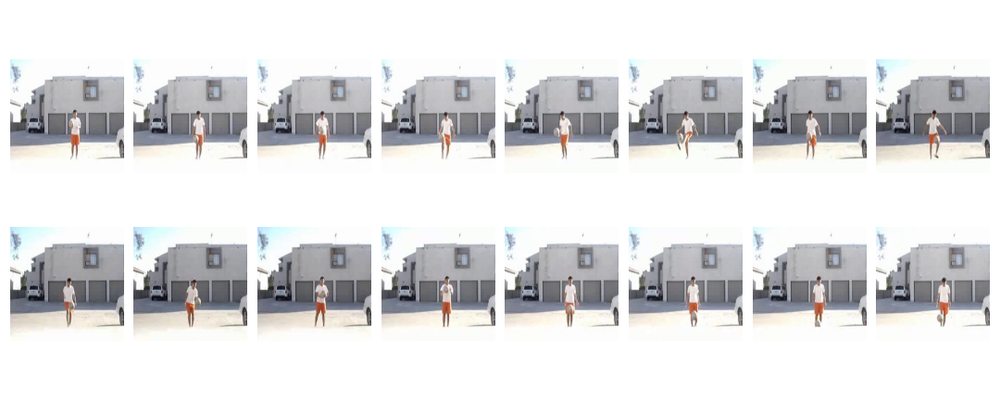

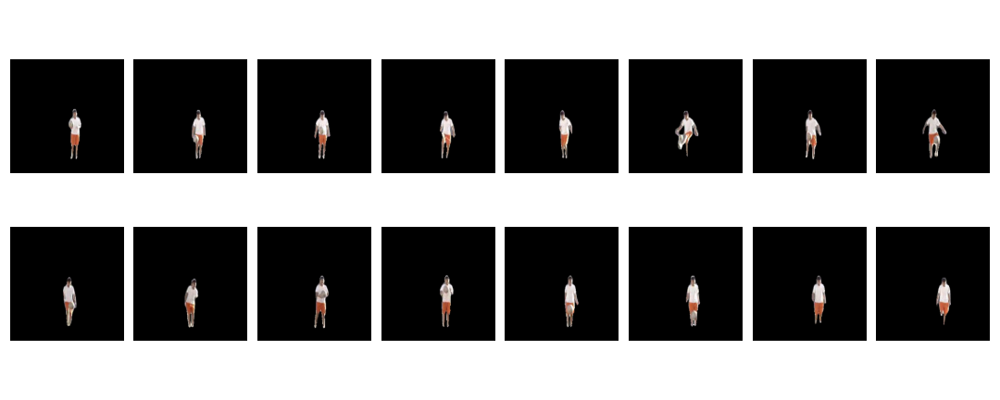

Prediction: Fall


In [ ]:
path = '/content/v_juggle_11_02.mp4'
pred = process_and_predict('urfd',path)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

100%|██████████| 239/239 [00:10<00:00, 21.79it/s]


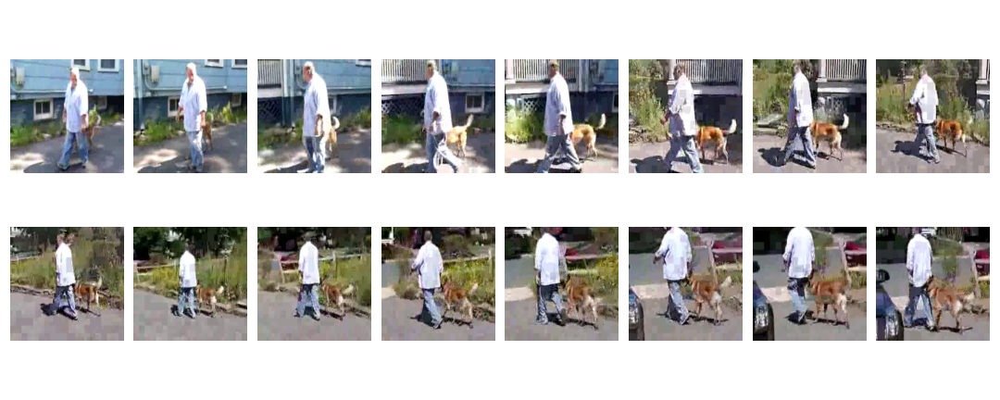

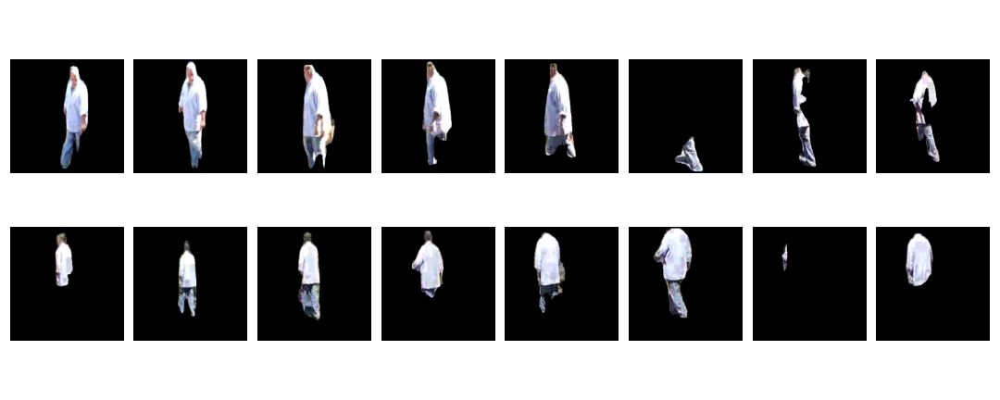

Prediction: Non Fall


In [ ]:
path = '/content/v_walk_dog_19_01.mp4'
pred = process_and_predict('urfd',path)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

100%|██████████| 239/239 [00:11<00:00, 21.05it/s]


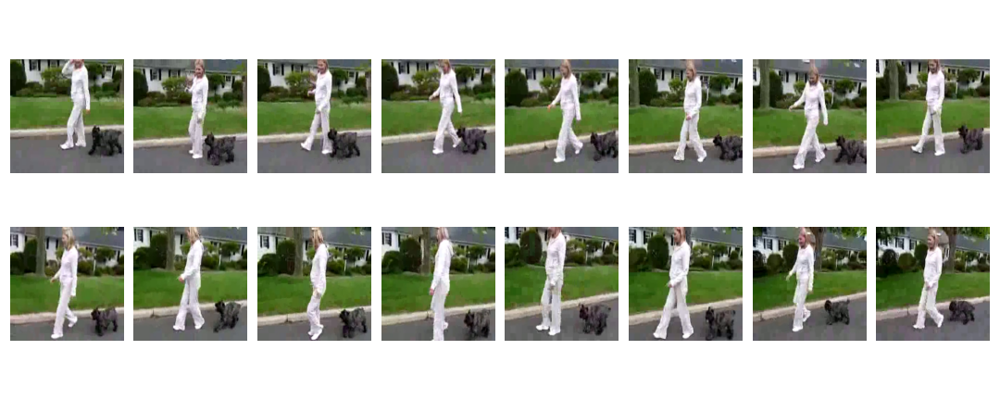

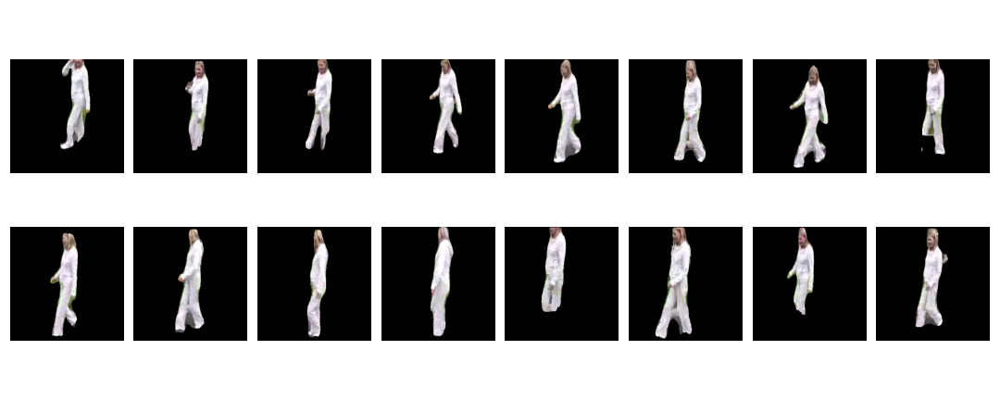

Prediction: Fall


In [ ]:
path = '/content/v_walk_dog_17_01.mp4'
pred = process_and_predict('urfd',path)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

100%|██████████| 85/85 [00:04<00:00, 18.47it/s]


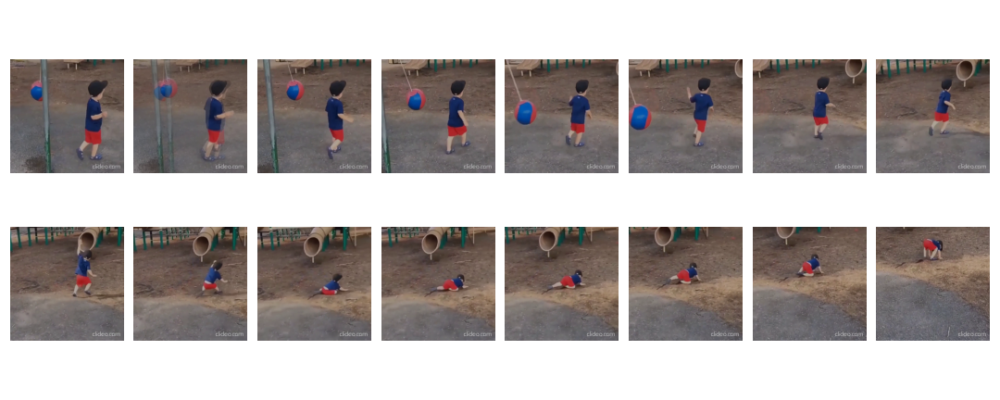

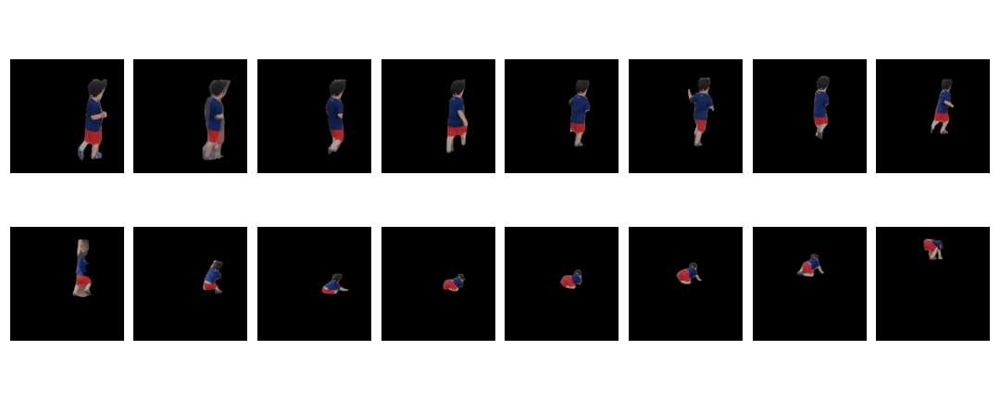

Prediction: Fall


In [ ]:
path = '/content/Fall 25.mp4'
pred = process_and_predict('urfd',path)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

100%|██████████| 80/80 [00:03<00:00, 20.41it/s]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


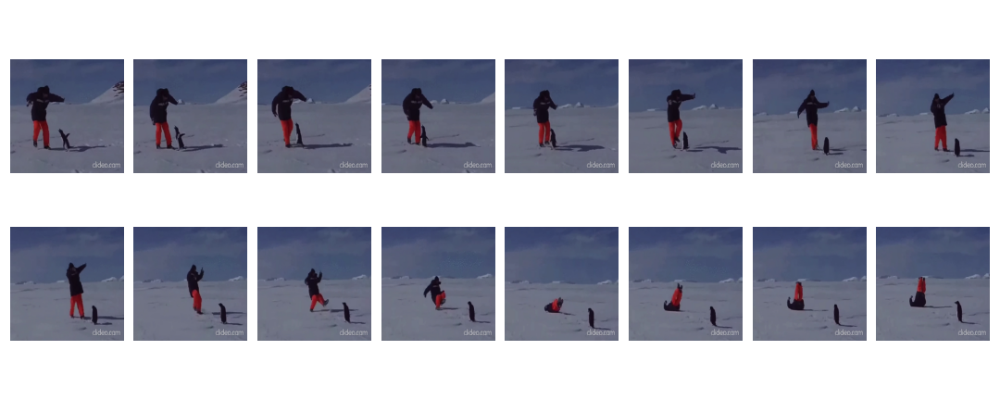

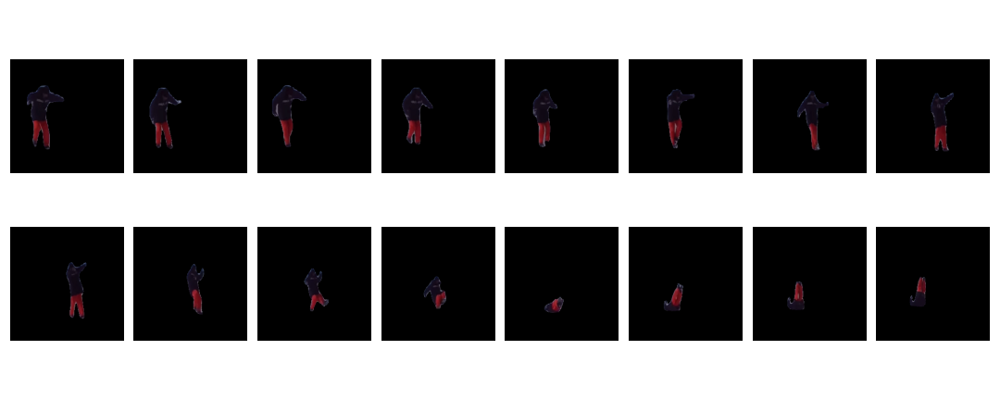

Prediction: Fall


In [ ]:
path = '/content/Fall 1.mp4'
pred = process_and_predict('urfd',path)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

100%|██████████| 299/299 [00:13<00:00, 22.36it/s]
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


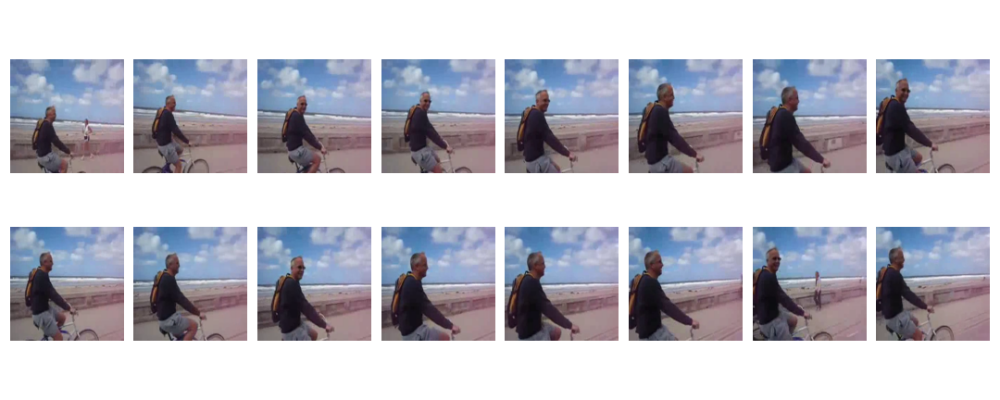

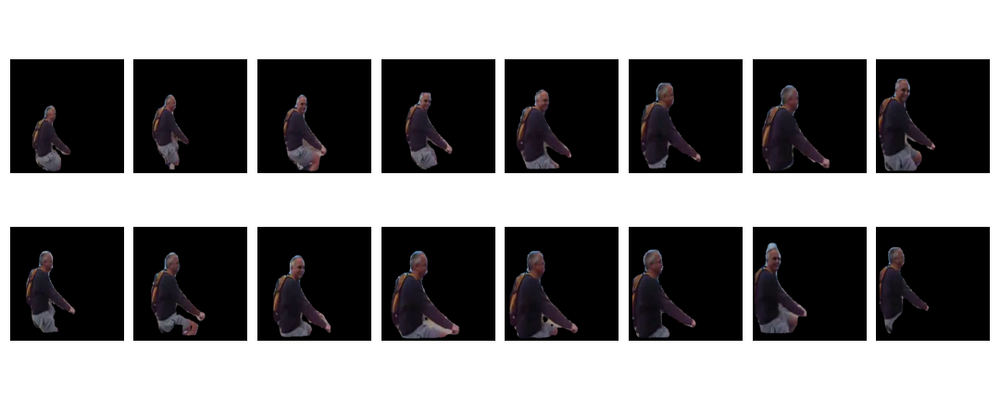

Prediction: Fall


In [ ]:
path = '/content/v_biking_05_01.mp4'
pred = process_and_predict('urfd',path)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

#MCFD artificial occlusion testing

100%|██████████| 45/45 [00:02<00:00, 20.99it/s]


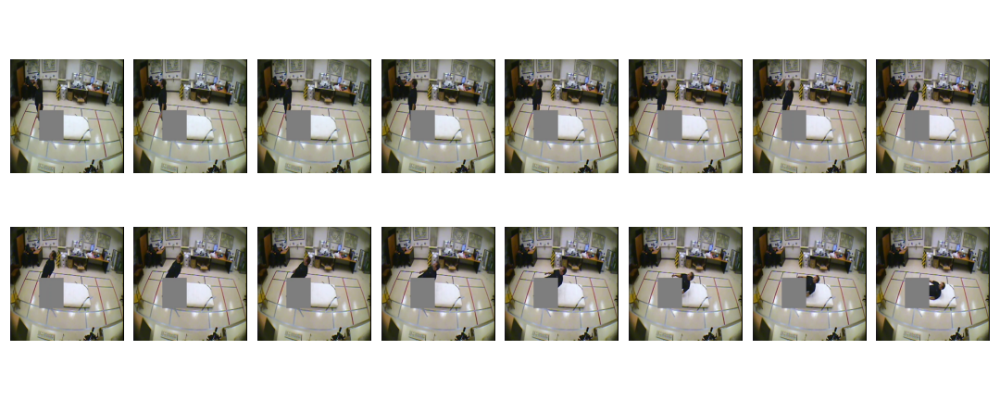

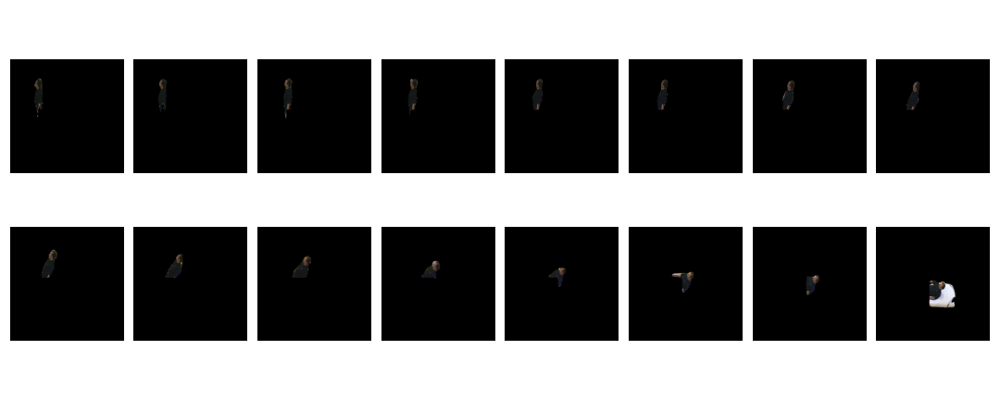

Prediction: Fall


In [13]:
path = '/content/mcfd_fall55(80%).mp4'
pred = process_and_predict('urfd',path)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

100%|██████████| 145/145 [00:06<00:00, 21.40it/s]


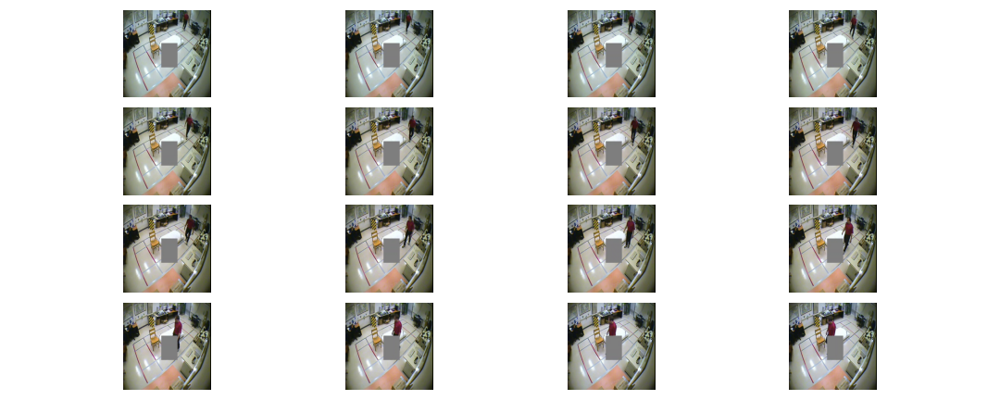

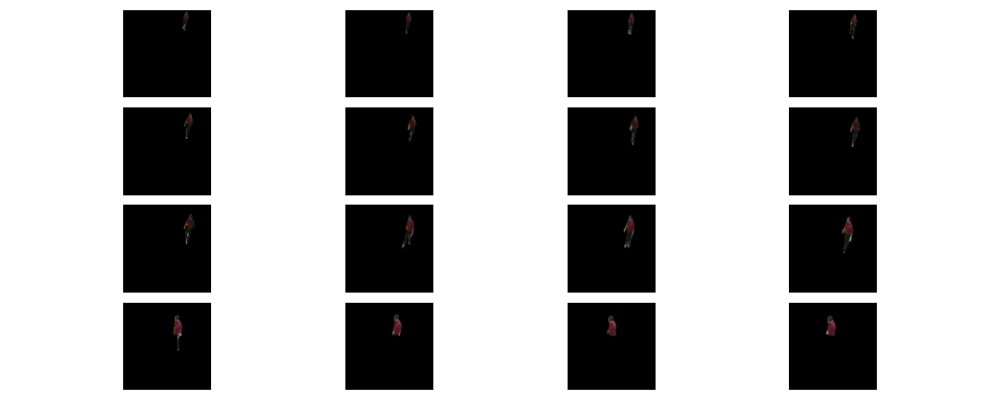

Prediction: Non Fall


In [16]:
path = '/content/mcfd_non_fall214(50%).mp4'
pred = process_and_predict('urfd',path)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

100%|██████████| 145/145 [00:06<00:00, 21.40it/s]


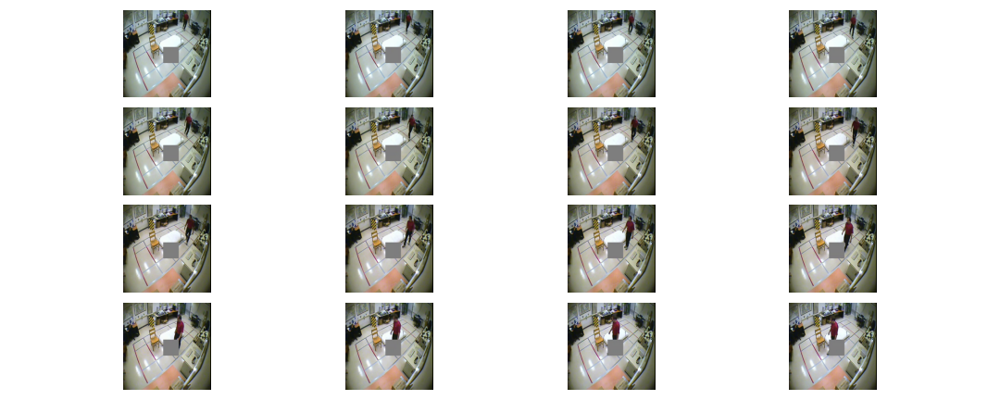

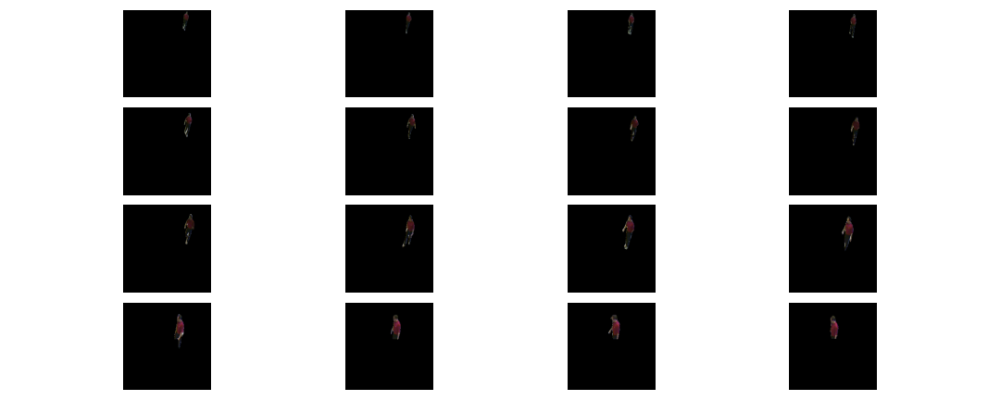

Prediction: Non Fall


In [17]:
path = '/content/mcfd_non_fall214(20%).mp4'
pred = process_and_predict('urfd',path)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))

100%|██████████| 145/145 [00:06<00:00, 21.22it/s]


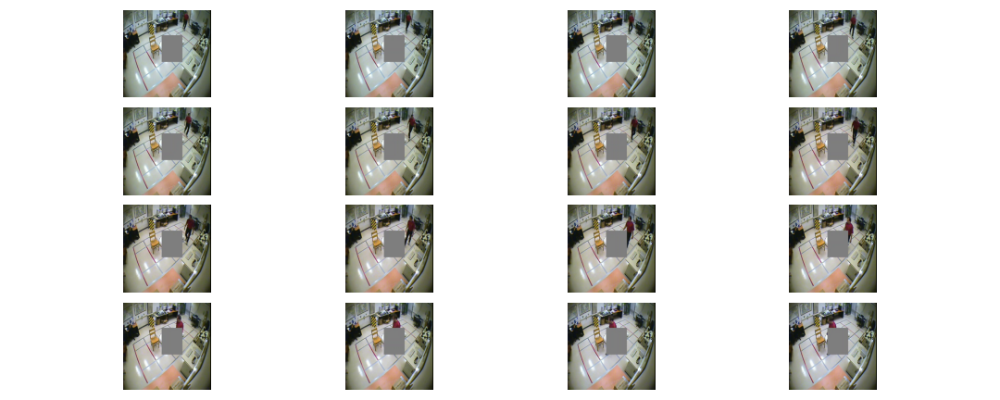

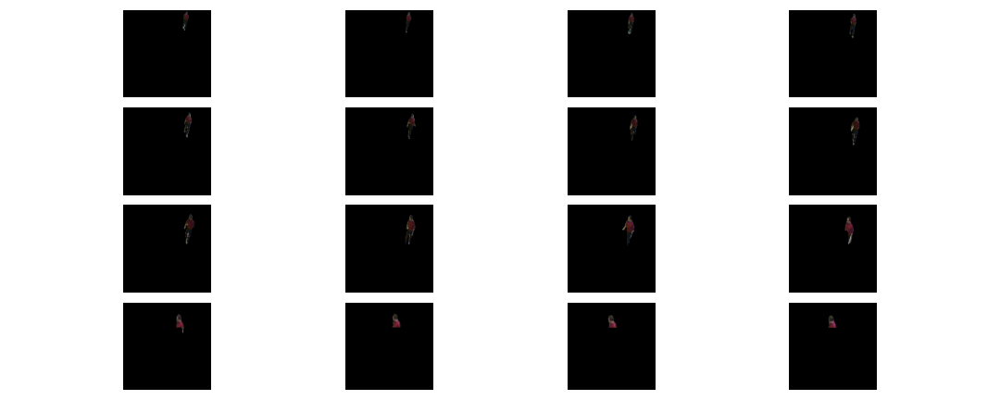

Prediction: Non Fall


In [18]:
path = '/content/mcfd_non_fall214(80%).mp4'
pred = process_and_predict('urfd',path)
result = np.argmax(pred)
print("Prediction: "+str(label[result]))